# Import Libraries

In [1]:
from tqdm import tqdm

%matplotlib inline
import matplotlib.pyplot as plt

from skimage.metrics import structural_similarity
from skimage.registration import phase_cross_correlation

import os
import re
import cv2
import numpy as np
import pandas as pd
import networkx as nx
from IPython.display import Image

pd.options.mode.chained_assignment = None  # default='warn'

import warnings
warnings.filterwarnings('ignore') 

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

import torchvision
from PIL import Image

In [2]:
class SiameseNetwork(nn.Module):
    """
    Siamese network for image similarity estimation.
    The network is composed of two identical networks, one for each input.
    The output of each network is concatenated and passed to a linear layer.
    The output of the linear layer passed through a sigmoid function.
    `"FaceNet" <https://arxiv.org/pdf/1503.03832.pdf>`_ is a variant of the Siamese network.
    This implementation varies from FaceNet as we use the `ResNet-18` model from
    `"Deep Residual Learning for Image Recognition" <https://arxiv.org/pdf/1512.03385.pdf>`_ as our feature extractor.
    In addition, we aren't using `TripletLoss` as the MNIST dataset is simple, so `BCELoss` can do the trick.
    """

    def __init__(self):
        super(SiameseNetwork, self).__init__()
        # get resnet model
        self.resnet = torchvision.models.resnet18(weights=None)

        # over-write the first conv layer to be able to read MNIST images
        # as resnet18 reads (3,x,x) where 3 is RGB channels
        # whereas MNIST has (1,x,x) where 1 is a gray-scale channel
        self.resnet.conv1 = nn.Conv2d(
            1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        )
        self.fc_in_features = self.resnet.fc.in_features

        # remove the last layer of resnet18 (linear layer which is before avgpool layer)
        self.resnet = torch.nn.Sequential(*(list(self.resnet.children())[:-1]))

        # initialize the weights
        self.resnet.apply(self.init_weights)

    def init_weights(self, m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight)
            m.bias.data.fill_(0.01)

    def forward_once(self, x):
        output = self.resnet(x)
        output = output.view(output.size()[0], -1)
        return output

    def forward(self, input1, input2):
        # get two images' features
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)

        return output1, output2

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SiameseNetwork().to(device)
model.load_state_dict(torch.load("../siamese/content/model_contrastive.pth"))
model.eval()

SiameseNetwork(
  (resnet): Sequential(
    (0): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats

In [4]:
transform = transforms.Compose([transforms.Resize((105, 105)), transforms.ToTensor()])


def transformation(transform, image1_path):
    img = Image.open(image1_path)
    img = img.convert("L")

    # Apply image transformations
    img = transform(img)
    return img


def registration(img1_path, img2_path):
    imgRef = cv2.imread(img1_path)
    imgTest = cv2.imread(img2_path)
    # Convert to grayscale.
    imgTest_grey = cv2.cvtColor(imgTest, cv2.COLOR_BGR2GRAY)
    imgRef_grey = cv2.cvtColor(imgRef, cv2.COLOR_BGR2GRAY)

    height1, width1 = imgRef_grey.shape
    height2, width2 = imgTest_grey.shape

    height_max = max(height1, height2)
    width_max = max(width1, width2)

    # Pad the images to same size
    imgRef_grey = cv2.copyMakeBorder(
        imgRef_grey,
        height_max - height1,
        0,
        width_max - width1,
        0,
        cv2.BORDER_REPLICATE,
    )
    imgTest_grey = cv2.copyMakeBorder(
        imgTest_grey,
        height_max - height2,
        0,
        width_max - width2,
        0,
        cv2.BORDER_REPLICATE,
    )

    # pixel precision first
    shift, _, _ = phase_cross_correlation(imgRef_grey, imgTest_grey)
    # print(f"Detected subpixel offset (y, x): {shift}")

    height_offset, weith_offset = int(shift[0]), int(shift[1])

    # Compute Similarity
    if height_offset > 0 and weith_offset > 0:
        imgRef_grey = imgRef_grey[height_offset:, weith_offset:]
        imgTest_grey = imgTest_grey[:-height_offset, :-weith_offset]

    elif height_offset > 0 and weith_offset < 0:
        imgRef_grey = imgRef_grey[height_offset:, :weith_offset]
        imgTest_grey = imgTest_grey[:-height_offset, -weith_offset:]

    elif height_offset < 0 and weith_offset > 0:
        imgRef_grey = imgRef_grey[:height_offset, weith_offset:]
        imgTest_grey = imgTest_grey[-height_offset:, :-weith_offset]

    elif height_offset < 0 and weith_offset < 0:
        imgRef_grey = imgRef_grey[:height_offset, :weith_offset]
        imgTest_grey = imgTest_grey[-height_offset:, -weith_offset:]

    elif height_offset == 0 and weith_offset > 0:
        imgRef_grey = imgRef_grey[:, weith_offset:]
        imgTest_grey = imgTest_grey[:, :-weith_offset]

    elif height_offset == 0 and weith_offset < 0:
        imgRef_grey = imgRef_grey[:, :weith_offset]
        imgTest_grey = imgTest_grey[:, -weith_offset:]

    elif height_offset > 0 and weith_offset == 0:
        imgRef_grey = imgRef_grey[height_offset:, :]
        imgTest_grey = imgTest_grey[:-height_offset, :]

    elif height_offset < 0 and weith_offset == 0:
        imgRef_grey = imgRef_grey[:height_offset, :]
        imgTest_grey = imgTest_grey[-height_offset:, :]

    elif height_offset == 0 and weith_offset == 0:
        imgRef_grey = imgRef_grey
        imgTest_grey = imgTest_grey

    return imgRef_grey, imgTest_grey


def register(img1_path, img2_path):
    imgRef_grey, imgTest_grey = registration(img1_path, img2_path)

    imgRef_grey = transform(Image.fromarray(imgRef_grey).convert("L"))
    imgTest_grey = transform(Image.fromarray(imgTest_grey).convert("L"))

    return imgRef_grey.to(device), imgTest_grey.to(device)


def computer_sim_score(img1_path, img2_path):
    imgRef_grey, imgTest_grey = registration(img1_path, img2_path)

    (score, diff) = structural_similarity(
        imgRef_grey,
        imgTest_grey,
        full=True,
    )

    return score

# Read Features

In [5]:
df = pd.read_csv("/home/yuxiao/nii_project/dataset/df/feature_data.csv")
df_plot = pd.read_csv("/home/yuxiao/nii_project/dataset/df/df_plot_test.csv")

In [6]:
df_plot["char"] = df_plot["char"].apply(lambda x: x[2:-2])
df_plot["len"] = df_plot["char"].apply(lambda x: len(x))

In [7]:
df_1 = df_plot[df_plot["len"]==1]
df_2 = df_plot[df_plot["len"]==2]
df_3 = df_plot[df_plot["len"]==3]
df_4 = df_plot[df_plot["len"]==4]

In [8]:
df_plot

,image1,image2,char,label,ssim,euclidean_distance,len
0,17427_001_19_1.jpg,18226_001_22_1.jpg,々,々,0.854484,1.332178,1
1,17427_001_19_1.jpg,18612_001_24_0.jpg,々,々,0.881403,1.729577,1
2,17427_001_19_1.jpg,18933_001_26_0.jpg,々,々,0.978437,0.715494,1
3,17427_001_19_1.jpg,19431_001_28_0.jpg,々,々,0.799649,1.444327,1
4,17427_001_19_1.jpg,20613_001_32_1.jpg,々,々,0.961819,0.725889,1
...,...,...,...,...,...,...,...
32201,35450_001_93_0.jpg,36581_001_99_1.jpg,より,与利,0.767282,1.215807,2
32202,35921_001_96_0.jpg,35923_001_96_0.jpg,より,与利,0.619369,1.213936,2
32203,35921_001_96_0.jpg,36581_001_99_1.jpg,より,与利,0.658597,1.007177,2
32204,35923_001_96_0.jpg,36581_001_99_1.jpg,より,与利,0.530056,1.043287,2


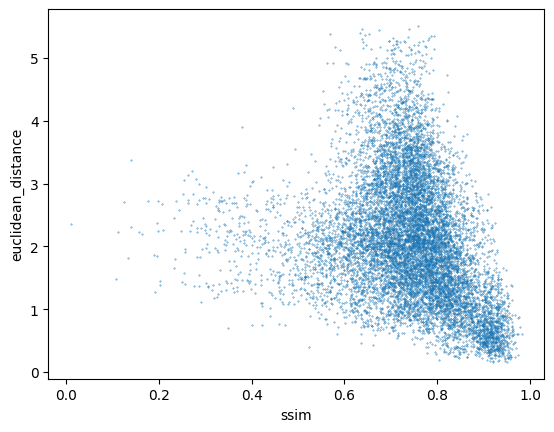

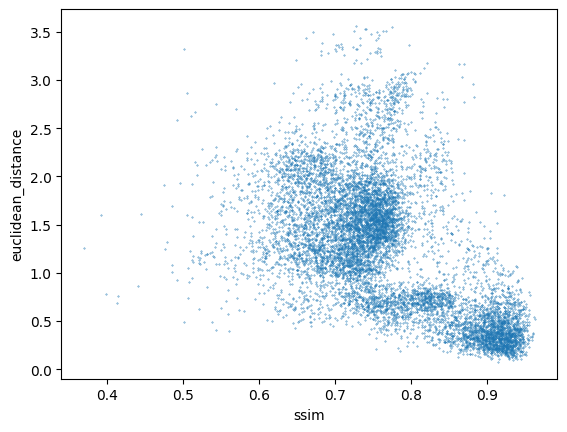

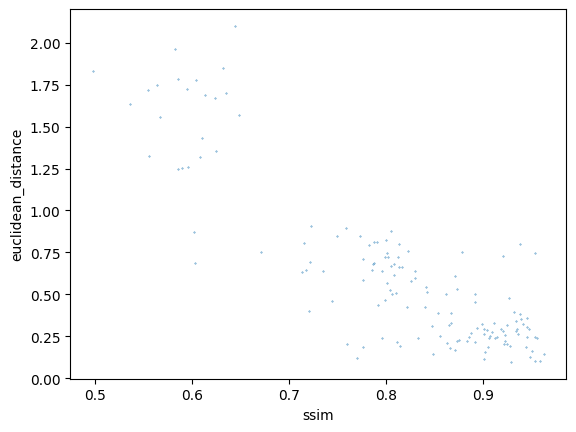

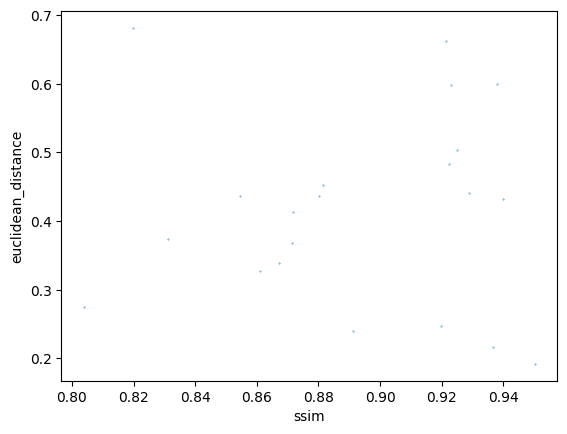

In [9]:
ax1 = df_1.plot.scatter(x='ssim',y='euclidean_distance', s=0.1)
ax2 = df_2.plot.scatter(x='ssim',y='euclidean_distance', s=0.1)
ax3 = df_3.plot.scatter(x='ssim',y='euclidean_distance', s=0.1)
ax4 = df_4.plot.scatter(x='ssim',y='euclidean_distance', s=0.1)

In [10]:
df_plot = df_plot.rename(columns={'image1': 'source', 'image2': 'target'})
df_plot

,source,target,char,label,ssim,euclidean_distance,len
0,17427_001_19_1.jpg,18226_001_22_1.jpg,々,々,0.854484,1.332178,1
1,17427_001_19_1.jpg,18612_001_24_0.jpg,々,々,0.881403,1.729577,1
2,17427_001_19_1.jpg,18933_001_26_0.jpg,々,々,0.978437,0.715494,1
3,17427_001_19_1.jpg,19431_001_28_0.jpg,々,々,0.799649,1.444327,1
4,17427_001_19_1.jpg,20613_001_32_1.jpg,々,々,0.961819,0.725889,1
...,...,...,...,...,...,...,...
32201,35450_001_93_0.jpg,36581_001_99_1.jpg,より,与利,0.767282,1.215807,2
32202,35921_001_96_0.jpg,35923_001_96_0.jpg,より,与利,0.619369,1.213936,2
32203,35921_001_96_0.jpg,36581_001_99_1.jpg,より,与利,0.658597,1.007177,2
32204,35923_001_96_0.jpg,36581_001_99_1.jpg,より,与利,0.530056,1.043287,2


In [11]:
np.unique(df_plot.char)

array(['々', 'ことし', 'ことに', 'ことの', "ふ' '不", 'ふかき', 'ふかく', 'ふき', 'ふく', 'ふくる',
       'ふけ', 'ふし', 'ふせく', 'ふた', 'ふたつ', 'ふち', 'ふと', 'ふみ', 'ふら', 'ふり', 'ふる',
       'ふるき', 'ふるゝ', 'ふれ', "み' '三", 'みたれ', 'みつから', 'みて', 'みな', 'みゆ',
       'みゆる', 'みる', 'みれは', 'みん', 'よ', 'よく', 'よし', 'よせ', 'よの', 'よふ', 'より',
       'よりも', '一', '一事', '一夜', '一年', '丁', '七', '万', '三日', '上', '下', '不堪'],
      dtype=object)

In [18]:
df_plot[df_plot["label"] == "万"].describe()

,ssim,euclidean_distance,len
count,528.000000,528.000000,528.0
mean,0.552457,1.759897,1.0
std,0.206246,0.805707,0.0
min,0.010433,0.196201,1.0
25%,0.370342,1.128989,1.0
50%,0.569097,1.941982,1.0
75%,0.773561,2.376384,1.0
max,0.901352,3.399821,1.0


In [20]:
from IPython.display import Image, display

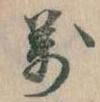

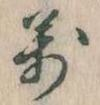

ssim0.6113977751695385 and distance2.325266
----------


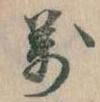

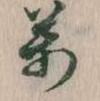

ssim0.2572082003098919 and distance1.9055245
----------


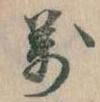

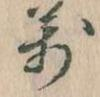

ssim0.5569914454897091 and distance2.569973
----------


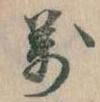

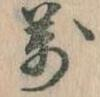

ssim0.8229763952112444 and distance0.4020256
----------


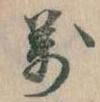

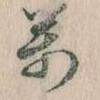

ssim0.4222974562900172 and distance2.4411025
----------


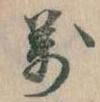

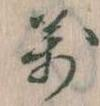

ssim0.6043049667374075 and distance2.5053833
----------


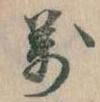

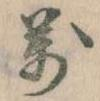

ssim0.8375063489793613 and distance0.2625078
----------


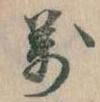

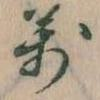

ssim0.6015303426064568 and distance2.3642712
----------


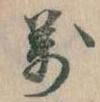

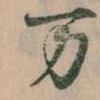

ssim0.3335052312248209 and distance2.7882428
----------


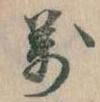

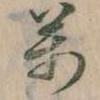

ssim0.3688951900037749 and distance2.6269805
----------


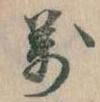

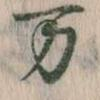

ssim0.2875991491415913 and distance2.9975445
----------


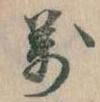

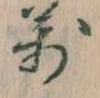

ssim0.579702663269771 and distance2.5890613
----------


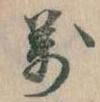

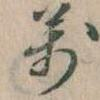

ssim0.4467509068424242 and distance2.652483
----------


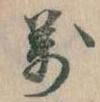

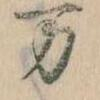

ssim0.3329629087482947 and distance2.7205513
----------


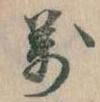

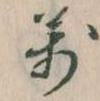

ssim0.5881638794863926 and distance2.6757922
----------


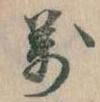

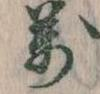

ssim0.7797006894875991 and distance0.62230426
----------


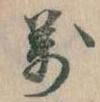

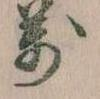

ssim0.8347660828709189 and distance0.73798406
----------


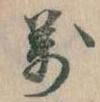

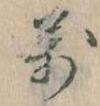

ssim0.6188996793606897 and distance2.196954
----------


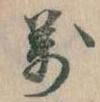

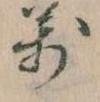

ssim0.2790931447081093 and distance3.0758605
----------


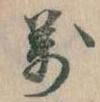

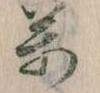

ssim0.4905090922245125 and distance2.382444
----------


In [21]:
count = 0
for idx, row in df_plot[df_plot["label"] == "万"].iterrows():
    display(Image(filename=f"../dataset/1/{row.source}"))
    display(Image(filename=f"../dataset/1/{row.target}"))
    print(f"ssim{row.ssim} and distance{row.euclidean_distance}")
    print("----------")
    count += 1
    if count == 20:
        break

In [23]:
G = nx.Graph()

# Read the edge list from the Pandas DataFrame
G = nx.from_pandas_edgelist(df_plot, 'source', 'target')

In [7]:
df_new = pd.read_csv("/home/yuxiao/nii_project/dataset/df/feature_data_2_new.csv")
df_new["block"] = df_new["label"] + df_new["block"].apply(lambda x: "_" + str(int(x)))
df_new.groupby(["label", "block"]).size()

In [10]:
label_list = np.unique(df.label)
df["block"] = np.nan

In [12]:
def char_is_hiragana(c) -> bool:
    return "\u3040" <= c <= "\u309F"


df_new[df["char"].apply(lambda x: len(x) == 1 and char_is_hiragana(x))]["char"].unique()

array(['に', 'き', 'し', 'と', 'は', 'そ', 'か', 'う', 'て', 'こ', 'よ', 'の', 'め',
       'を', 'な', 'た', 'ま', 'れ', 'も', 'い', 'ふ', 'く', 'す', 'あ', 'る', 'お',
       'へ', 'さ', 'ち', 'け', 'や', 'ひ', 'み', 'つ', 'り', 'ぬ', 'ん', 'え', 'せ',
       'ろ', 'ほ', 'わ', 'む', 'ゆ', 'ら', 'ゐ', 'ね', 'ゑ', 'ご', 'が', 'ぞ'],
      dtype=object)

  1%|          | 56/4598 [00:05<08:25,  8.99it/s] 

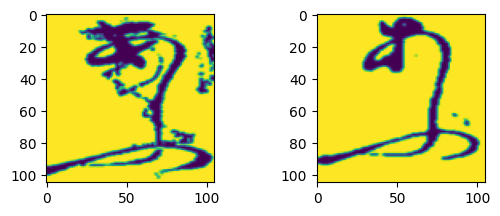

  2%|▏         | 101/4598 [00:25<18:55,  3.96it/s] 


In [35]:
for i in tqdm(range(len(label_list))):
    count = 0
    char = re.sub("[\W\d_]+", "", label_list[i])
    if len(char) == 2:
        for idx1, row1 in df.loc[df["label"] == label_list[i]].iterrows():
            img1 = transformation(transform, "../dataset/2/" + row1.image_file).to(device)
            for idx2, row2 in df.loc[df["label"] == label_list[i]].iterrows():
                if idx2 > idx1 and count < 5:
                    img2 = transformation(transform, "../dataset/2/" + row2.image_file).to(
                        device
                    )
                    output1, output2 = model(img1.unsqueeze(0), img2.unsqueeze(0))
                    euclidean_distance = F.pairwise_distance(output1, output2)
                    sim_score = computer_sim_score(
                        "../dataset/2/" + row1.image_file,
                        "../dataset/2/" + row2.image_file,
                    )
                    # if (
                    #     ((0.5 < euclidean_distance < 1.5) and (0.75 < sim_score < 0.95))
                    #     or (1 < euclidean_distance < 0.5)
                    #     or (0.9 < sim_score < 0.95)
                    # ):
                    # if (0.8 < sim_score < 0.85):
                    if ((euclidean_distance > 2) and (sim_score < 0.5)):
                        count += 1
                        fig = plt.figure()
                        ax1 = fig.add_subplot(2, 2, 1)
                        ax1.imshow(img1[0].cpu())
                        ax2 = fig.add_subplot(2, 2, 2)
                        ax2.imshow(img2[0].cpu())

                        plt.show()
                        break
    if i > 100:
        break

  0%|          | 18/4598 [00:00<00:30, 151.68it/s]

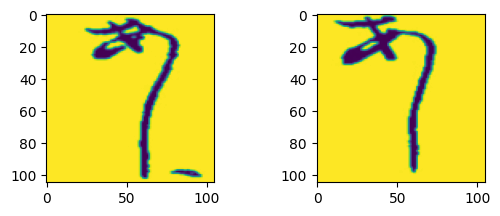

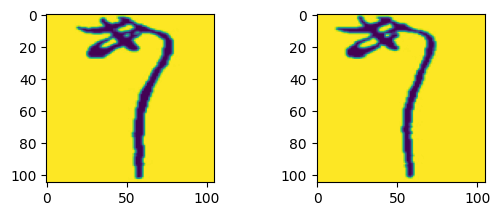

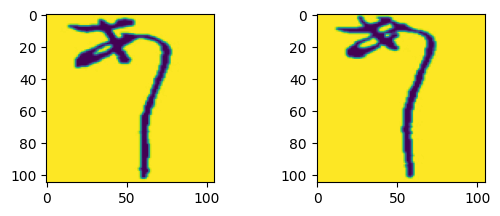

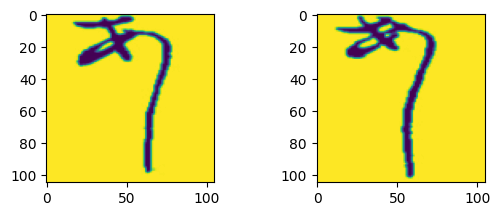

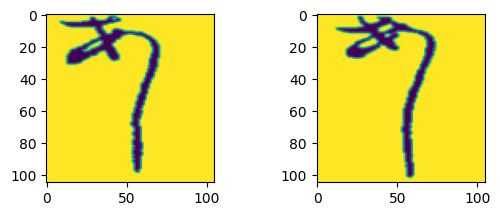

  1%|          | 34/4598 [00:02<07:27, 10.19it/s] 

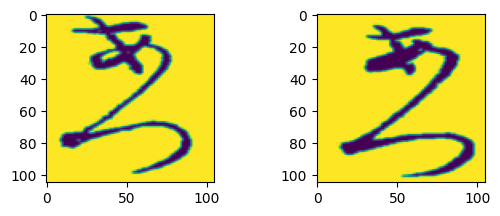

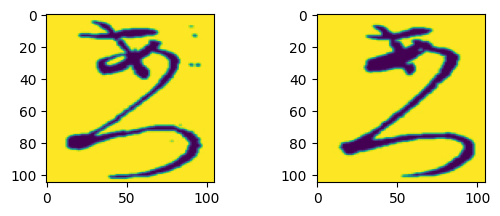

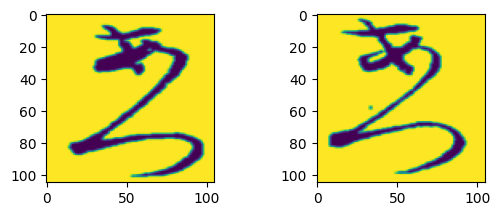

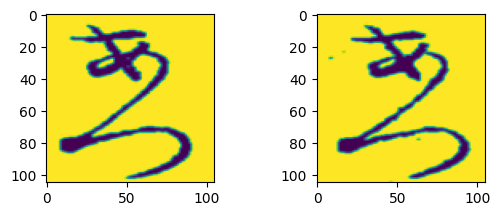

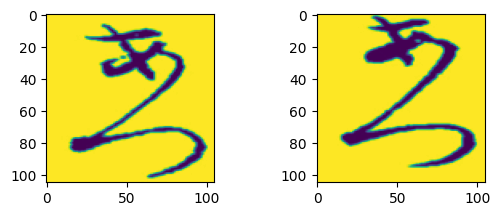

  1%|          | 42/4598 [00:04<10:16,  7.39it/s]

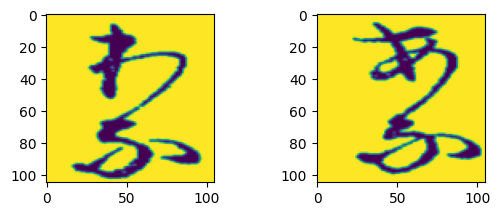

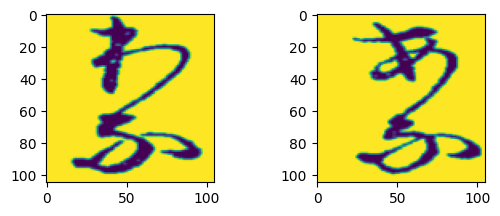

  1%|▏         | 58/4598 [00:06<09:33,  7.92it/s]

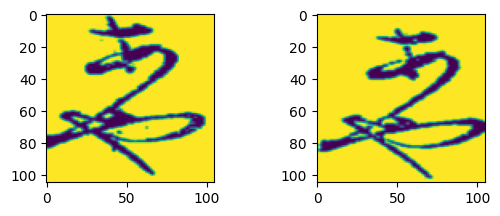

  2%|▏         | 73/4598 [00:08<11:06,  6.79it/s]

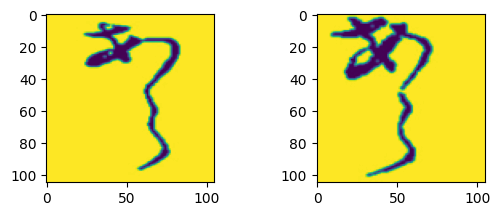

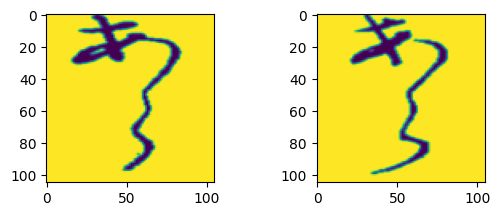

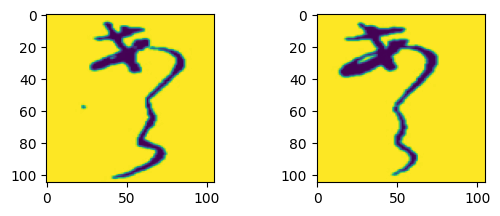

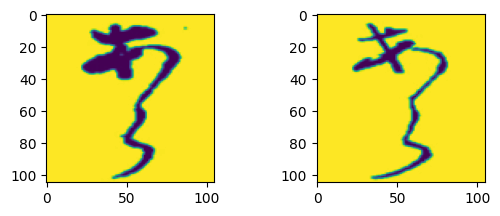

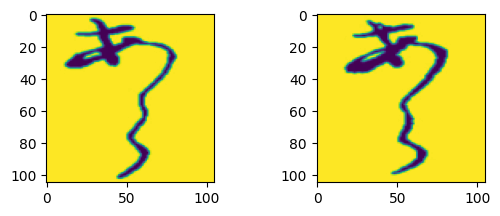

  2%|▏         | 81/4598 [00:11<15:02,  5.00it/s]

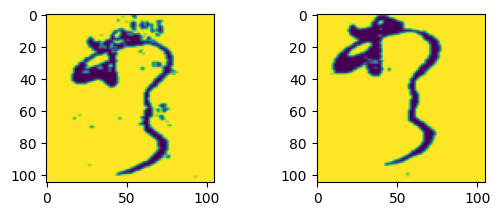

  2%|▏         | 101/4598 [00:15<11:22,  6.58it/s]


In [33]:
for i in tqdm(range(len(label_list))):
    count = 0
    char = re.sub("[\W\d_]+", "", label_list[i])
    if len(char) == 2:
        for idx1, row1 in df.loc[df["label"] == label_list[i]].iterrows():
            img1 = transformation(transform, "../dataset/2/" + row1.image_file).to(device)
            for idx2, row2 in df.loc[df["label"] == label_list[i]].iterrows():
                if idx2 > idx1 and count < 5:
                    img2 = transformation(transform, "../dataset/2/" + row2.image_file).to(
                        device
                    )
                    output1, output2 = model(img1.unsqueeze(0), img2.unsqueeze(0))
                    euclidean_distance = F.pairwise_distance(output1, output2)
                    sim_score = computer_sim_score(
                        "../dataset/2/" + row1.image_file,
                        "../dataset/2/" + row2.image_file,
                    )
                    # if (
                    #     ((0.5 < euclidean_distance < 1.5) and (0.75 < sim_score < 0.95))
                    #     or (1 < euclidean_distance < 0.5)
                    #     or (0.9 < sim_score < 0.95)
                    # ):
                    # if (0.8 < sim_score < 0.85):
                    if ((euclidean_distance < 0.5) and (sim_score < 0.8)):
                        count += 1
                        fig = plt.figure()
                        ax1 = fig.add_subplot(2, 2, 1)
                        ax1.imshow(img1[0].cpu())
                        ax2 = fig.add_subplot(2, 2, 2)
                        ax2.imshow(img2[0].cpu())

                        plt.show()
                        break
    if i > 100:
        break

  0%|          | 18/4598 [00:00<00:45, 101.07it/s]

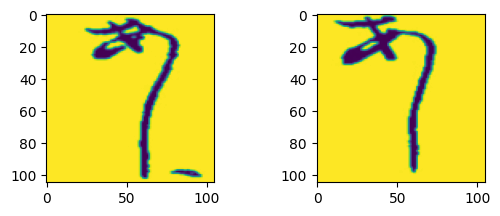

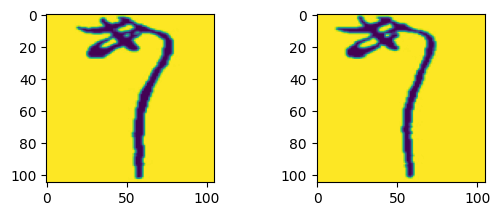

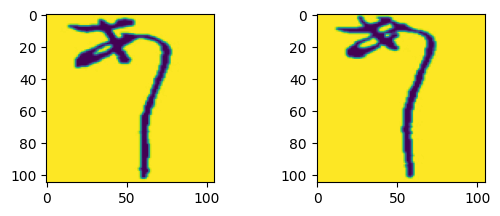

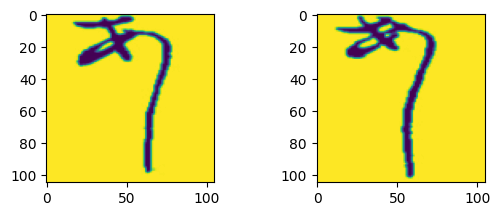

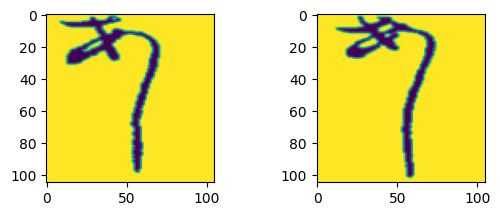

  1%|          | 29/4598 [00:03<10:00,  7.61it/s] 

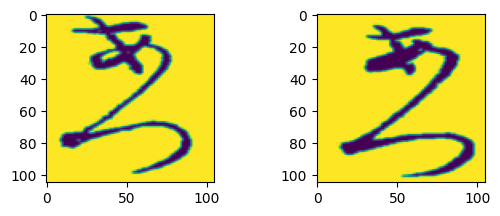

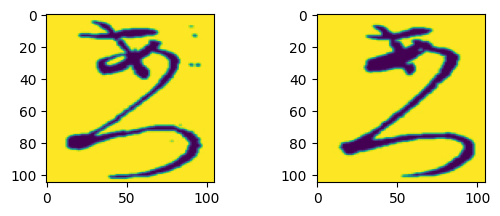

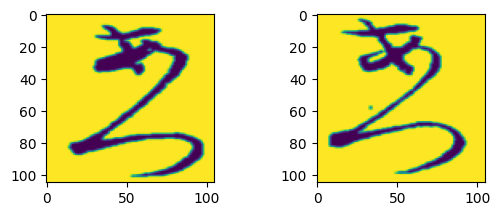

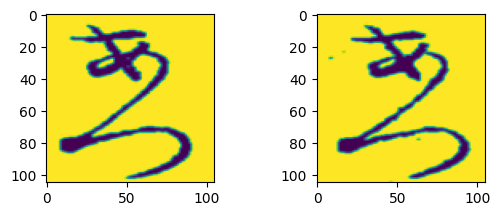

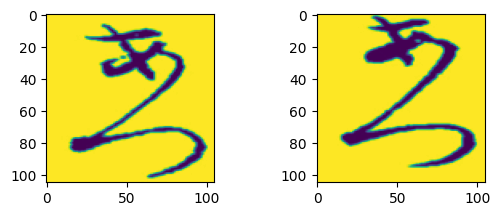

  1%|          | 42/4598 [00:05<10:41,  7.11it/s]

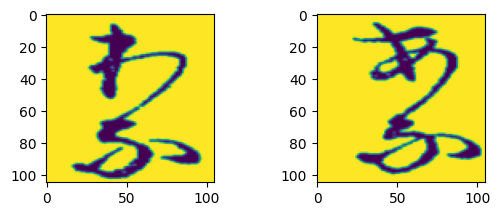

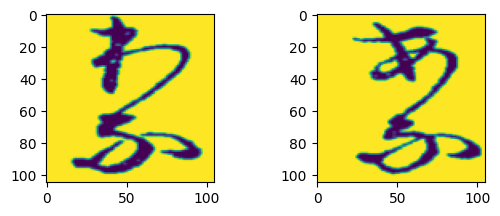

  1%|▏         | 58/4598 [00:08<11:20,  6.67it/s]

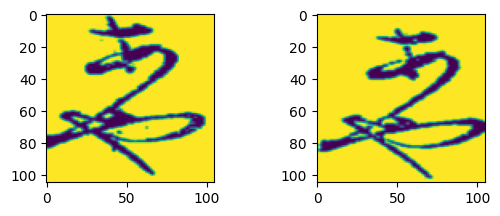

  2%|▏         | 73/4598 [00:10<12:51,  5.86it/s]

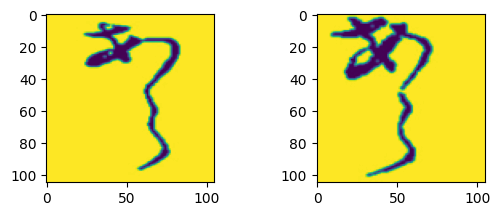

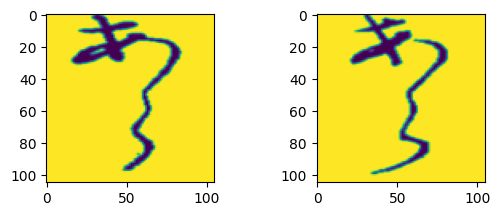

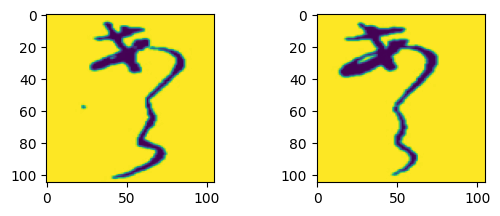

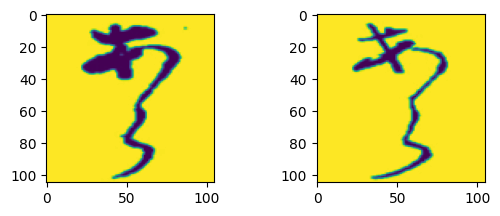

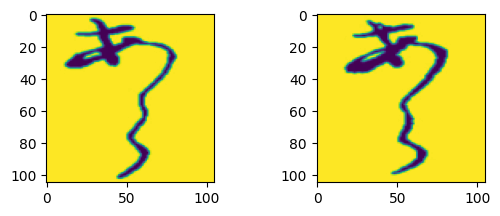

  2%|▏         | 81/4598 [00:12<16:27,  4.57it/s]

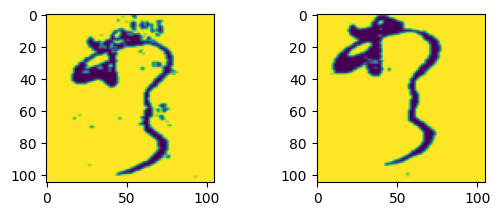

  2%|▏         | 101/4598 [00:17<13:04,  5.73it/s]


In [21]:
for i in tqdm(range(len(label_list))):
    count = 0
    char = re.sub("[\W\d_]+", "", label_list[i])
    if len(char) == 2:
        for idx1, row1 in df.loc[df["label"] == label_list[i]].iterrows():
            img1 = transformation(transform, "../dataset/2/" + row1.image_file).to(device)
            for idx2, row2 in df.loc[df["label"] == label_list[i]].iterrows():
                if idx2 > idx1 and count < 5:
                    img2 = transformation(transform, "../dataset/2/" + row2.image_file).to(
                        device
                    )
                    output1, output2 = model(img1.unsqueeze(0), img2.unsqueeze(0))
                    euclidean_distance = F.pairwise_distance(output1, output2)
                    sim_score = computer_sim_score(
                        "../dataset/2/" + row1.image_file,
                        "../dataset/2/" + row2.image_file,
                    )
                    # if (
                    #     ((0.5 < euclidean_distance < 1.5) and (0.75 < sim_score < 0.95))
                    #     or (1 < euclidean_distance < 0.5)
                    #     or (0.9 < sim_score < 0.95)
                    # ):
                    # if (0.8 < sim_score < 0.85):
                    if ((euclidean_distance < 0.5) and (sim_score < 0.8)):
                        count += 1
                        fig = plt.figure()
                        ax1 = fig.add_subplot(2, 2, 1)
                        ax1.imshow(img1[0].cpu())
                        ax2 = fig.add_subplot(2, 2, 2)
                        ax2.imshow(img2[0].cpu())

                        plt.show()
                        break
    if i > 100:
        break

  1%|          | 46/4598 [00:04<07:35, 10.00it/s]

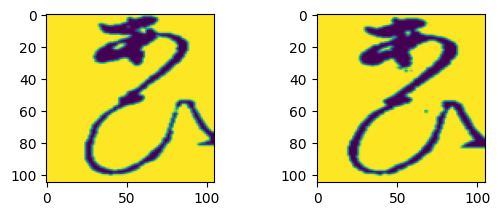

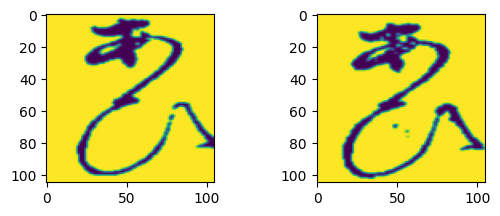

  1%|          | 53/4598 [00:05<09:47,  7.74it/s]

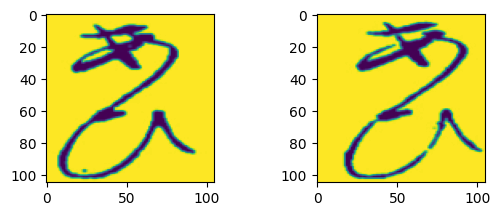

  2%|▏         | 82/4598 [00:28<1:18:08,  1.04s/it]

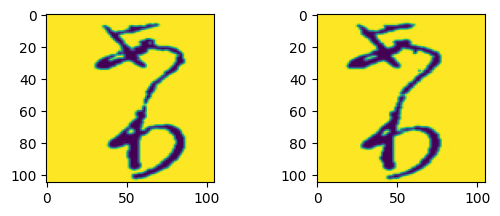

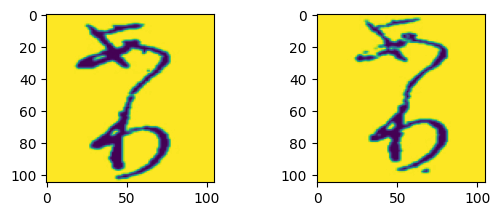

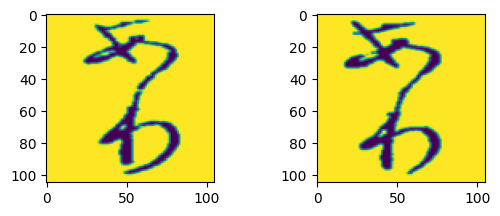

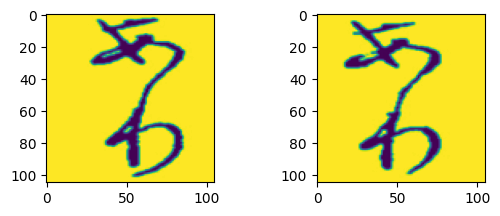

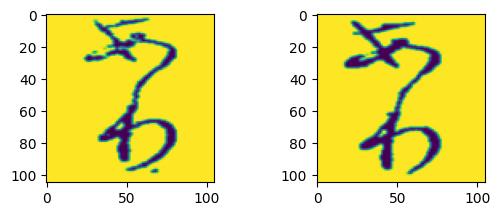

  3%|▎         | 128/4598 [01:14<56:58,  1.31it/s]  

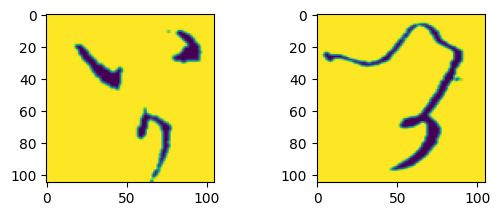

  4%|▍         | 201/4598 [01:35<34:52,  2.10it/s]  


In [28]:
for i in tqdm(range(len(label_list))):
    count = 0
    char = re.sub("[\W\d_]+", "", label_list[i])
    if len(char) == 2:
        for idx1, row1 in df.loc[df["label"] == label_list[i]].iterrows():
            img1 = transformation(transform, "../dataset/2/" + row1.image_file).to(device)
            for idx2, row2 in df.loc[df["label"] == label_list[i]].iterrows():
                if idx2 > idx1 and count < 5:
                    img2 = transformation(transform, "../dataset/2/" + row2.image_file).to(
                        device
                    )
                    output1, output2 = model(img1.unsqueeze(0), img2.unsqueeze(0))
                    euclidean_distance = F.pairwise_distance(output1, output2)
                    sim_score = computer_sim_score(
                        "../dataset/2/" + row1.image_file,
                        "../dataset/2/" + row2.image_file,
                    )
                    # if (
                    #     ((0.5 < euclidean_distance < 1.5) and (0.75 < sim_score < 0.95))
                    #     or (1 < euclidean_distance < 0.5)
                    #     or (0.9 < sim_score < 0.95)
                    # ):
                    # if (0.8 < sim_score < 0.85):
                    if ((euclidean_distance > 1.5) and (sim_score > 0.8)):
                        count += 1
                        fig = plt.figure()
                        ax1 = fig.add_subplot(2, 2, 1)
                        ax1.imshow(img1[0].cpu())
                        ax2 = fig.add_subplot(2, 2, 2)
                        ax2.imshow(img2[0].cpu())

                        plt.show()
                        break
    if i > 200:
        break

  0%|          | 0/4598 [00:00<?, ?it/s]

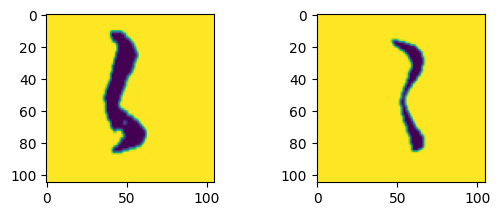

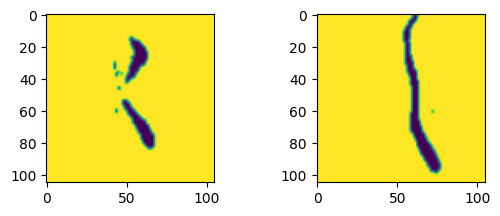

  0%|          | 1/4598 [00:01<1:54:04,  1.49s/it]

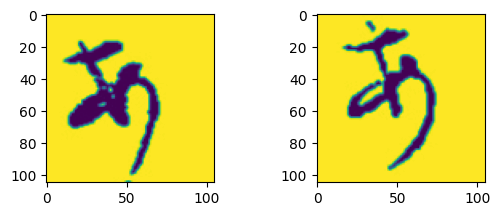

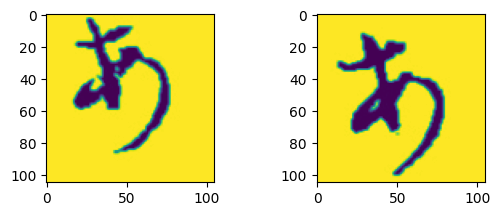

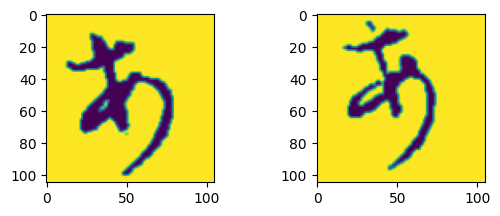

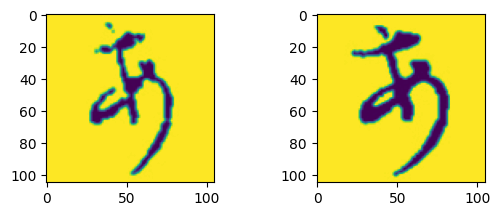

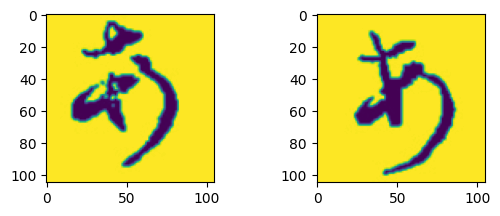

  0%|          | 5/4598 [00:04<1:13:35,  1.04it/s]

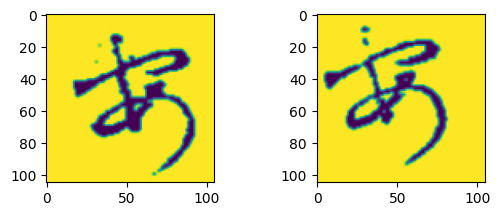

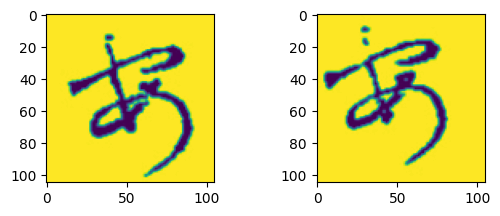

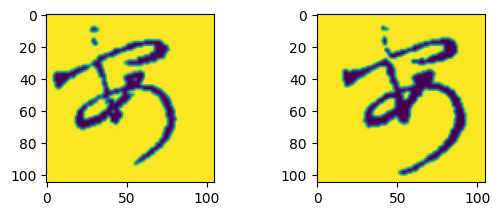

  0%|          | 6/4598 [00:06<1:18:03,  1.02s/it]

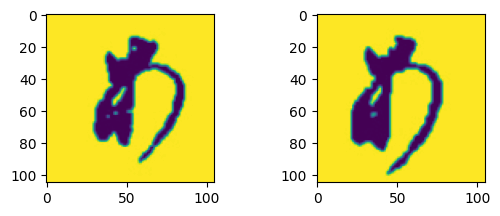

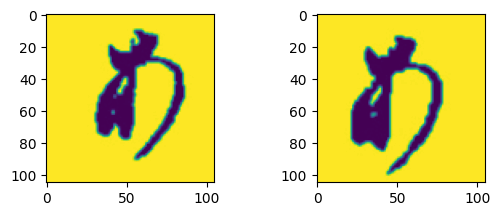

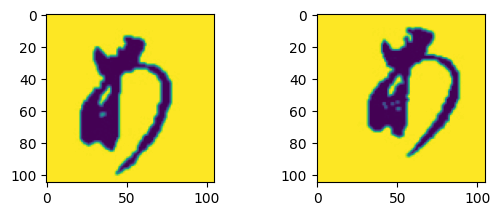

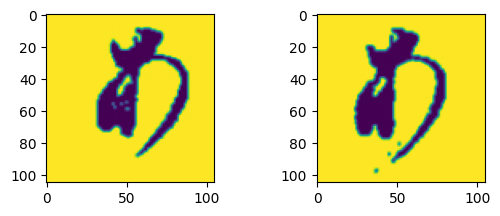

  0%|          | 7/4598 [00:08<1:39:32,  1.30s/it]

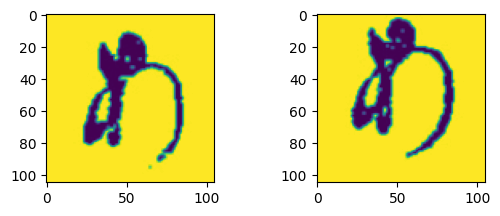

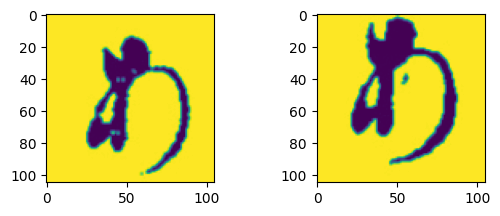

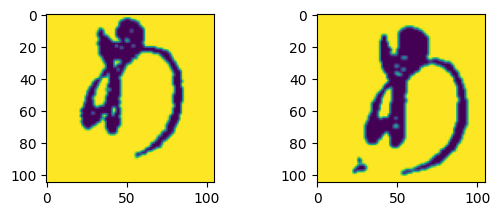

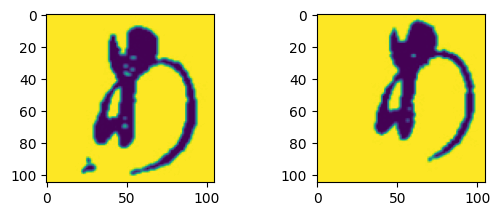

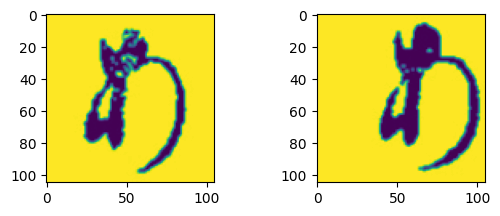

  1%|          | 51/4598 [00:15<23:43,  3.19it/s]  


In [36]:
for i in tqdm(range(len(label_list))):
    count = 0
    char = re.sub("[\W\d_]+", "", label_list[i])
    for idx1, row1 in df.loc[df["label"] == label_list[i]].iterrows():
            img1 = transformation(transform, "../dataset/2/" + row1.image_file).to(device)
            for idx2, row2 in df.loc[df["label"] == label_list[i]].iterrows():
                if idx2 > idx1 and count < 5:
                    img2 = transformation(transform, "../dataset/2/" + row2.image_file).to(
                        device
                    )
                    output1, output2 = model(img1.unsqueeze(0), img2.unsqueeze(0))
                    euclidean_distance = F.pairwise_distance(output1, output2)
                    sim_score = computer_sim_score(
                        "../dataset/2/" + row1.image_file,
                        "../dataset/2/" + row2.image_file,
                    )
                    # if (
                    #     ((0.5 < euclidean_distance < 1.5) and (0.75 < sim_score < 0.95))
                    #     or (1 < euclidean_distance < 0.5)
                    #     or (0.9 < sim_score < 0.95)
                    # ):
                    # if (0.8 < sim_score < 0.85):
                    if ((euclidean_distance > 1.5) and (sim_score > 0.7)):
                        count += 1
                        fig = plt.figure()
                        ax1 = fig.add_subplot(2, 2, 1)
                        ax1.imshow(img1[0].cpu())
                        ax2 = fig.add_subplot(2, 2, 2)
                        ax2.imshow(img2[0].cpu())

                        plt.show()
                        break
    if i > 50:
        break

  0%|          | 0/4598 [00:00<?, ?it/s]

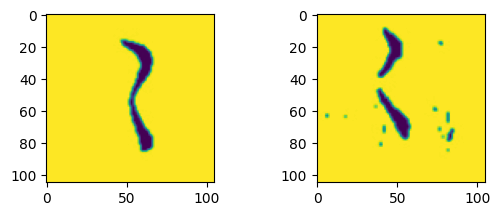

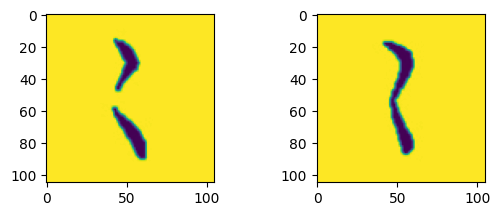

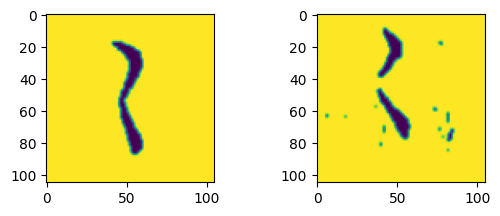

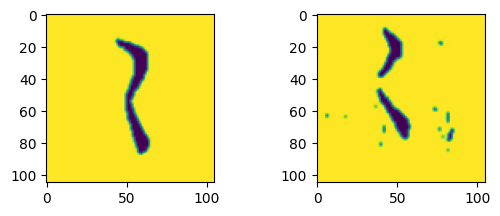

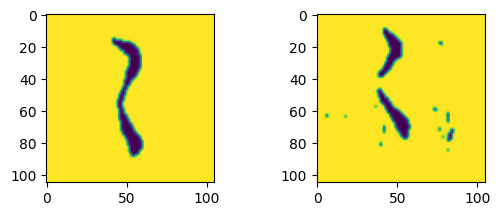

  0%|          | 1/4598 [00:01<2:32:09,  1.99s/it]

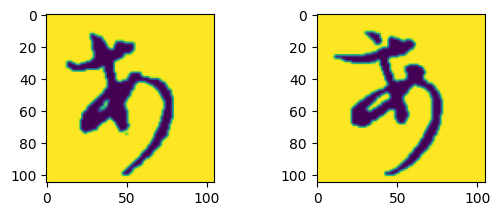

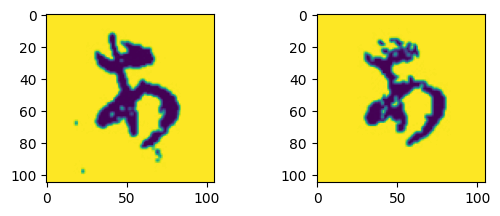

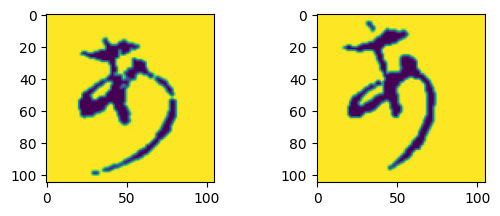

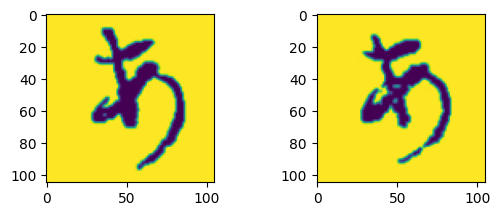

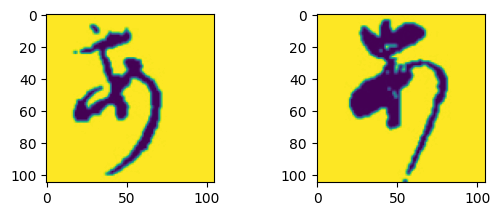

  0%|          | 9/4598 [00:24<2:22:37,  1.86s/it]

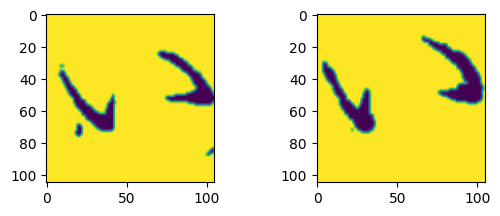

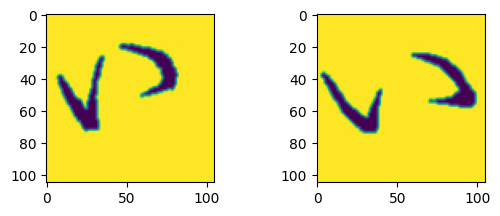

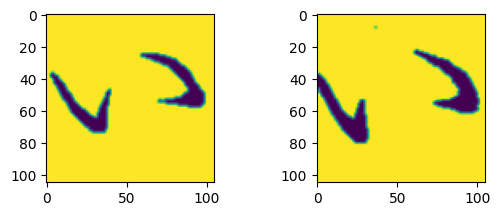

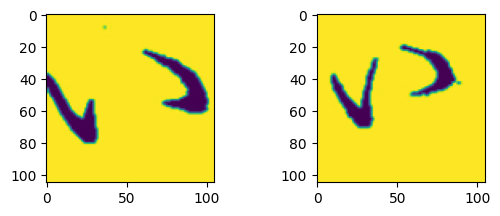

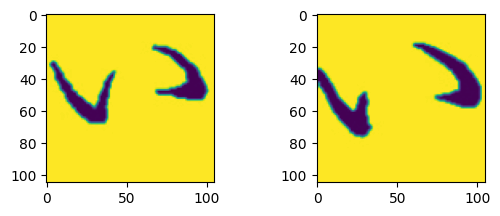

  3%|▎         | 137/4598 [00:27<04:10, 17.78it/s]

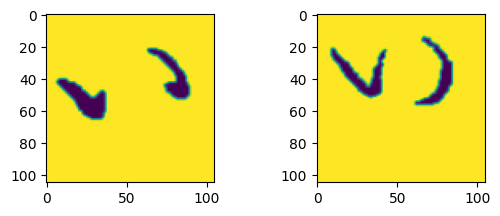

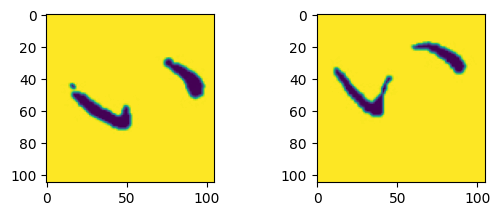

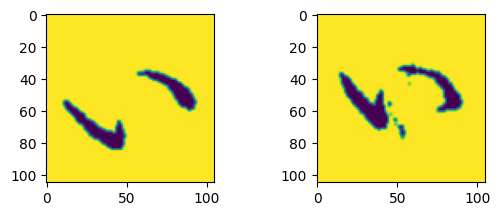

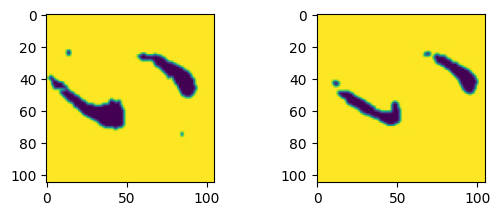

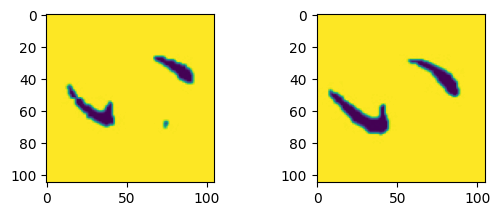

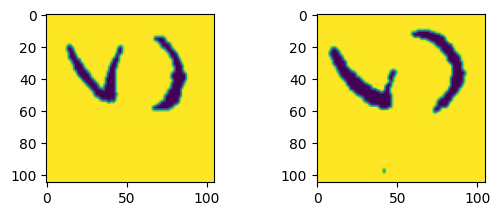

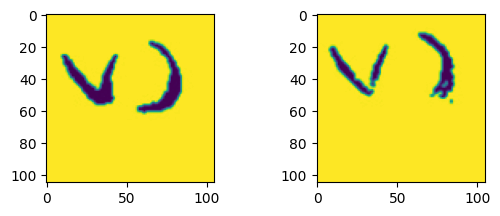

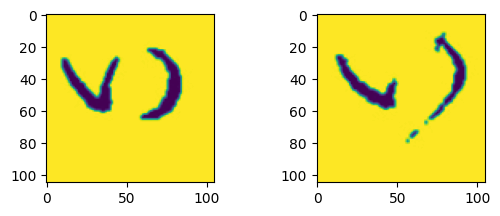

  3%|▎         | 137/4598 [00:37<04:10, 17.78it/s]

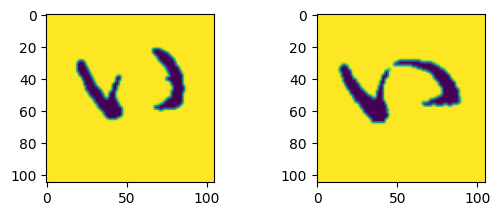

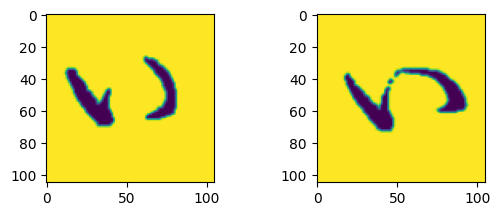

  3%|▎         | 139/4598 [00:39<13:57,  5.32it/s]

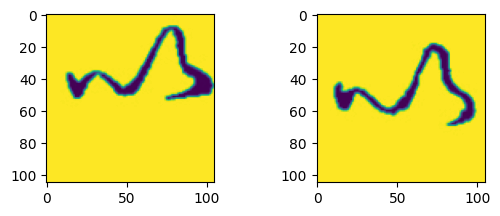

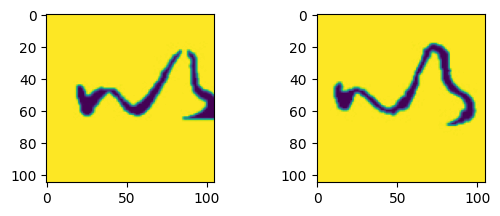

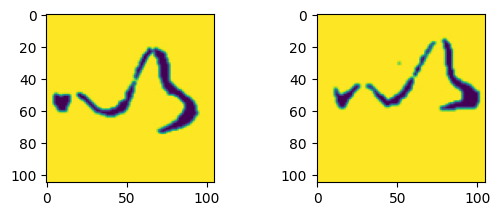

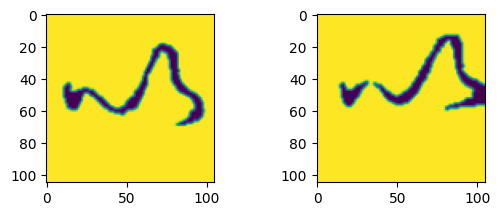

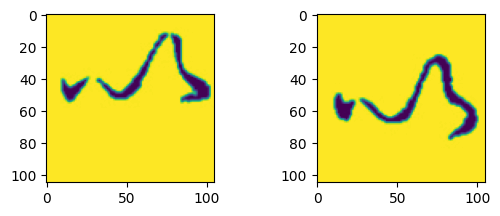

  4%|▍         | 201/4598 [00:43<15:42,  4.67it/s]


In [30]:
for i in tqdm(range(len(label_list))):
    count = 0
    char = re.sub("[\W\d_]+", "", label_list[i])
    if len(char) == 1:
        for idx1, row1 in df.loc[df["label"] == label_list[i]].iterrows():
            img1 = transformation(transform, "../dataset/2/" + row1.image_file).to(device)
            for idx2, row2 in df.loc[df["label"] == label_list[i]].iterrows():
                if idx2 > idx1 and count < 5:
                    img2 = transformation(transform, "../dataset/2/" + row2.image_file).to(
                        device
                    )
                    output1, output2 = model(img1.unsqueeze(0), img2.unsqueeze(0))
                    euclidean_distance = F.pairwise_distance(output1, output2)
                    sim_score = computer_sim_score(
                        "../dataset/2/" + row1.image_file,
                        "../dataset/2/" + row2.image_file,
                    )
                    # if (
                    #     ((0.5 < euclidean_distance < 1.5) and (0.75 < sim_score < 0.95))
                    #     or (1 < euclidean_distance < 0.5)
                    #     or (0.9 < sim_score < 0.95)
                    # ):
                    # if (0.8 < sim_score < 0.85):
                    if ((euclidean_distance < 0.5) and (sim_score < 0.8)):
                        count += 1
                        fig = plt.figure()
                        ax1 = fig.add_subplot(2, 2, 1)
                        ax1.imshow(img1[0].cpu())
                        ax2 = fig.add_subplot(2, 2, 2)
                        ax2.imshow(img2[0].cpu())

                        plt.show()
                        break
    if i > 200:
        break

In [ ]:
img1 = transformation(
    transform, "/home/yuxiao/nii_project/dataset/2/22253_001_39_1.jpg"
).to(device)
img2 = transformation(
    transform, "/homee/yuxiao/nii_project/dataset/2/3548_001_115_0.jpg"
).to(device)

img1, img2 = register(
    "/home/yuxiao/nii_project/dataset/2/22253_001_39_1.jpg",
    "/home/yuxiao/nii_project/dataset/2/3548_001_115_0.jpg",
)
o1, o2 = model(img1.unsqueeze(0), img2.unsqueeze(0))
euclidean_distance = F.pairwise_distance(o1, o2)
euclidean_distance

In [ ]:
df.loc[df["label"] == "子_0"].groupby("block").size().sort_values()

In [ ]:
from IPython.display import Image, display

In [ ]:
for url in df.loc[df["block"] == 7].image_file:
    display(Image(filename="../dataset/1/" + url))